<a href="https://colab.research.google.com/github/magourram/algo_mass_data/blob/main/project_author.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Project 4: Plant leave recognizer
Using the «Prado Museum Pictures» dataset of Project 3, the task is to implement a deep-learning-based system classifying pictures according to any reasonable organization of classes (e.g., by author–selecting a manageable subset of authors, or by support). Note that the dataset does not directly contain the picture images, but these can be downloaded separately using the work_image_url attribute of the  prado.csv file.

- https://docs.google.com/document/d/1gsd5ZgMbbysU3OG1W1VL_SlPvMh8q-xjl7mffJ5xoBQ/edit#heading=h.qifoo7co6qtd



# Libraries

In [1]:
import os
import time
import glob ##
import json

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.image import imread
import seaborn as sns
from PIL import Image
import shutil
from shutil import copyfile
import zipfile
import random
from tqdm import tqdm

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.utils import class_weight

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Conv2D, MaxPooling2D, Flatten, Dropout, Input, AveragePooling2D, concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

!pip install keras-tuner --upgrade --quiet
import keras_tuner as kt
from keras_tuner import HyperModel, RandomSearch
from keras.metrics import AUC, Precision, Recall, Accuracy
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping ##
'''
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
'''
# Install kaggle
!pip install -q kaggle --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.4 MB/s eta 0:00:00


In [2]:
'''
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
'''

'\nimport warnings\nwarnings.filterwarnings("ignore", category=DeprecationWarning)\n'

## Kaggle API

In [3]:
start_time = time.time()

In [4]:
# To be replaced with 'xxxxxx'
os.environ['KAGGLE_USERNAME'] = "marwandatascience"
os.environ['KAGGLE_KEY'] = "977a40d1687fc65d5423c595327e29f3"

In [5]:
# Create a new directory
new_directory_path = '/content/zip_file'
!mkdir "{new_directory_path}"

In [6]:
# Download dataset files and locatet it in the directory
%cd /content/zip_file
!kaggle datasets download -d maparla/prado-museum-pictures

/content/zip_file
100% 24.9G/24.9G [03:19<00:00, 201MB/s]
100% 24.9G/24.9G [03:19<00:00, 134MB/s]


# Functions

In [7]:
# Function to extract images from a zipped file [remove]
def extract_file(zip_file_path, extraction_path):
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_path)
    path = os.path.join(extraction_path, 'images', 'images')
    print(f'The number of images in the folder is: {count_images_in_folder(path)}')

In [8]:
# Remove directories even if not empty
def remove_non_empty_directory(directory_path):
    try:
        shutil.rmtree(directory_path)
        print(f"Directory '{directory_path}' and its contents have been successfully removed.")
    except Exception as e:
        print(f"Error: {e}")

In [9]:
# Count the number of images in folder
def count_images_in_folder(folder_path):
    extensions = ['jpg', 'jpeg', 'png']  # Add more if needed

    # Use glob to get a list of files with specified extensions
    image_files = [file for ext in extensions for file in glob.glob(os.path.join(folder_path, f'*.{ext}'))]

    # Count the number of image files
    num_images = len(image_files)

    return num_images

In [10]:
# Count the number of images in each subfolder after the re-allocation
def count_images_in_subfolders(root_folder, data_split):
    folder_path = os.path.join(root_folder, data_split)

    for subfolder in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder)

        if os.path.isdir(subfolder_path):
            # Counting the number of files with extension ".jpg" in each subfolder
            num_images = len([file for file in os.listdir(subfolder_path) if file.lower().endswith('.jpg')])

            # Printing the results
            print(f"Subfolder '{subfolder}' in '{data_split}' contains {num_images} images.")

In [11]:
# Function to plot images
def plot_images_from_folder(folder, num_cols=2):
    # Get a list of subfolders in the train folder
    subfolders = [f.path for f in os.scandir(folder) if f.is_dir()]

    # Calculate number of rows required
    num_rows = (len(subfolders) + num_cols - 1) // num_cols

    # Set up the subplot grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

    # Flatten the axes array to make it easier to iterate
    axes = axes.flatten()

    # Plot one image from each subfolder
    for i, subfolder in enumerate(subfolders):
        # Get the list of images in the subfolder
        images = [f.path for f in os.scandir(subfolder) if f.is_file() and f.name.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Plot the first image in the subfolder
        if images:
            img_path = images[0]
            img = mpimg.imread(img_path)

            # Extract subfolder name from the path for the plot title
            subfolder_name = os.path.basename(subfolder)

            # Plot the image
            axes[i].imshow(img)
            axes[i].set_title(subfolder_name)
            axes[i].axis('off')  # Turn off axis labels

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()

# Image Classification by Author

## Setup

### Zip Extraction

In [12]:
# Set the path to zip file
zip_file_path = '/content/zip_file/prado-museum-pictures.zip'

# Set the path for the zip extraction
extraction_path = '/content/zip_file'
os.makedirs(extraction_path, exist_ok=True)

# Extract images using function
extract_file(zip_file_path, extraction_path)

The number of images in the folder is: 13472


### Accessing the csv file

In [13]:
# Reading the dataframe and make it accessible
extraction_path = "/content/zip_file"
df = pd.read_csv(os.path.join(extraction_path, "prado.csv"))

df["work_id"] = df['work_image_url'].apply(lambda x: x.split('/')[-1])

for _, row in df.iterrows():
    image_id = row["work_id"]
    image_path = os.path.join("images", image_id)

# Remove unneccesary columns
columns_to_drop = [0, 1, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
df.drop(columns=df.columns[columns_to_drop], inplace=True)

In [14]:
# Plot the generic information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13487 entries, 0 to 13486
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   author     13487 non-null  object
 1   author_id  12360 non-null  object
 2   work_id    13487 non-null  object
dtypes: object(3)
memory usage: 316.2+ KB


### Analysis on the authors

In [15]:
# Create a copy of the original dataframe and remove empty cells from author_id
df_f = df[['author_id', 'author', 'work_id']].dropna(subset=['author_id'])

# Resetting the index
df_f = df_f.reset_index(drop=True)

# Create a new column 'total_occurrences' based on 'author_id' counts for EDA purposes
df_f['total_occurrences'] = df_f['author_id'].map(df_f['author_id'].value_counts())

# Extract the id related to Anonimous artists
anonimo_author_id = df_f.loc[df_f['author'] == 'Anónimo', 'author_id'].iloc[0]

# Remove from the dataframe the anonimous artists
df_f = df_f[df_f['author_id'] != anonimo_author_id].reset_index(drop=True)

df_f

,author_id,author,work_id,total_occurrences
0,b218fee4-053b-4656-8577-9aa001ad1989,"Bayeu y Subías, Francisco",404387d6-a52c-4477-b598-de2a2d5a3d55.jpg,446
1,b20a5ee9-2ebd-4e60-aadc-e91e7867cb12,"Crespi, Giuseppe Maria",589ee4a3-28fa-4977-a84d-7326f5c9aeb3.jpg,4
2,26861819-ff88-4fde-8a37-56db9e1c1ba4,"Cronenburch, Adriaen van",4a8bab74-ca91-450a-b5b7-39dd61e2d7f3.jpg,4
3,a8c659ad-d887-4703-8af3-1832dfc88eb7,"González Velázquez, Zacarías",9af5b176-b4d3-4930-854b-5b5f252829f1.jpg,29
4,521b82d6-6848-4f7d-96dc-3b8f102dd8b5,"Obra copiada de Cano de la Peña, Eduardo",4c494f0a-d5ae-45ca-826b-59f4b5fd4398.jpg,10
...,...,...,...,...
9656,361ddf6c-ba4f-45ef-a835-644ddc70ee8a,Julien de Parma,b184ebe1-c79e-482c-b91c-028e945aa66c.jpg,2
9657,d351c3c1-e89b-49cf-900d-24085ed1908f,"Atribuido Falck, Jeremías",c62f7f3e-3ad3-4d9e-9586-b0b389b2d032.jpg,1
9658,9e420297-9fb9-4ef3-b128-96596d5dc191,"Atribuido Kiyonobu, Tori",6c28accf-e0c0-4bc0-b4c6-3fbb282bcbd8.jpg,1
9659,d984cdeb-020c-41f9-ae68-3285aebfa25a,"García, Sergio",b4126fb6-c5ac-40e3-89a1-d1578914c09b.jpg,1


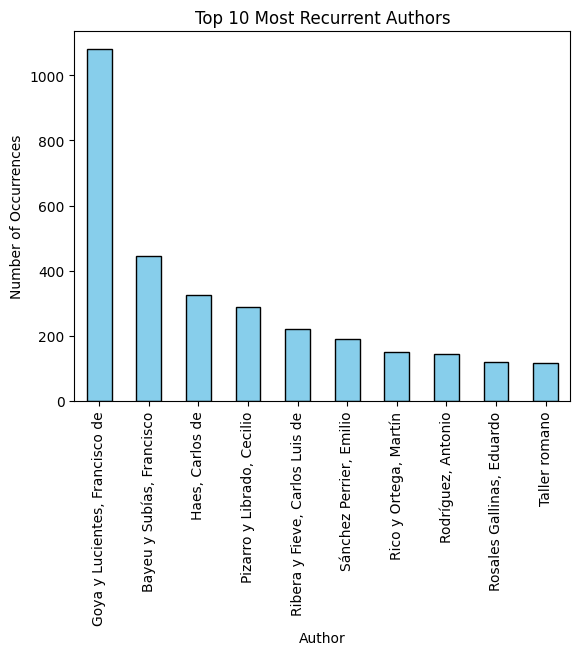

In [16]:
# Get the 20 most recurrent authors
top_authors = df_f['author'].value_counts().head(10)

# Plotting the histogram
top_authors.plot(kind='bar', color='skyblue', edgecolor='black')

# Adding labels and title
plt.xlabel('Author')
plt.ylabel('Number of Occurrences')
plt.title('Top 10 Most Recurrent Authors')

# Show the plot
plt.show()

In [17]:
# Create a dataframe with just authors_id and authors_name as reference
authors_df = df_f[['author_id', 'author']]
authors_df = authors_df.drop_duplicates(subset='author_id').reset_index(drop=True)
authors_df

,author_id,author
0,b218fee4-053b-4656-8577-9aa001ad1989,"Bayeu y Subías, Francisco"
1,b20a5ee9-2ebd-4e60-aadc-e91e7867cb12,"Crespi, Giuseppe Maria"
2,26861819-ff88-4fde-8a37-56db9e1c1ba4,"Cronenburch, Adriaen van"
3,a8c659ad-d887-4703-8af3-1832dfc88eb7,"González Velázquez, Zacarías"
4,521b82d6-6848-4f7d-96dc-3b8f102dd8b5,"Obra copiada de Cano de la Peña, Eduardo"
...,...,...
1796,f2259d91-6fe8-4bec-acba-456be42565ea,"Pavon, Luigi"
1797,5cdf0673-76d3-4151-acf5-fbe95c1915a7,"Pagano, Matteo"
1798,d351c3c1-e89b-49cf-900d-24085ed1908f,"Atribuido Falck, Jeremías"
1799,9e420297-9fb9-4ef3-b128-96596d5dc191,"Atribuido Kiyonobu, Tori"


Understanding how to create a consistent baseline for the classes to be used in the CNNs.


In [18]:
# Merge authors_df with df_f based on 'author_id', keeping all occurrences in df_f
df_merged_final = pd.merge(
    authors_df[['author_id', 'author']],
    df_f[['author_id', 'total_occurrences']].drop_duplicates(subset='author_id').reset_index(drop=True),
    on='author_id',
    how='left')

df_merged_final

,author_id,author,total_occurrences
0,b218fee4-053b-4656-8577-9aa001ad1989,"Bayeu y Subías, Francisco",446
1,b20a5ee9-2ebd-4e60-aadc-e91e7867cb12,"Crespi, Giuseppe Maria",4
2,26861819-ff88-4fde-8a37-56db9e1c1ba4,"Cronenburch, Adriaen van",4
3,a8c659ad-d887-4703-8af3-1832dfc88eb7,"González Velázquez, Zacarías",29
4,521b82d6-6848-4f7d-96dc-3b8f102dd8b5,"Obra copiada de Cano de la Peña, Eduardo",10
...,...,...,...
1796,f2259d91-6fe8-4bec-acba-456be42565ea,"Pavon, Luigi",1
1797,5cdf0673-76d3-4151-acf5-fbe95c1915a7,"Pagano, Matteo",1
1798,d351c3c1-e89b-49cf-900d-24085ed1908f,"Atribuido Falck, Jeremías",1
1799,9e420297-9fb9-4ef3-b128-96596d5dc191,"Atribuido Kiyonobu, Tori",1


### Setting up a sample of images


In [19]:
# Filter rows with 'total_occurrences' at least minimum_img (number of images per author)
minimum_img = 200 #to be adjusted number of images for each author
df_merged_final_1 = df_merged_final[df_merged_final['total_occurrences'] >= minimum_img].reset_index(drop=True)
df_merged_final_1

,author_id,author,total_occurrences
0,b218fee4-053b-4656-8577-9aa001ad1989,"Bayeu y Subías, Francisco",446
1,39568a17-81b5-4d6f-84fa-12db60780812,"Goya y Lucientes, Francisco de",1097
2,5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,"Ribera y Fieve, Carlos Luis de",222
3,1e7197fc-e941-418b-a0c9-4ce34ce633e9,"Haes, Carlos de",326
4,0b7d7dd0-cb66-4ee0-9f01-1cc526587980,"Pizarro y Librado, Cecilio",290


In [20]:
# Settings
total_number_classes = len(df_merged_final_1) #depending on minimum_img
print("Number of rows in the DataFrame:", total_number_classes)

Number of rows in the DataFrame: 5


In [21]:
# Train to be adjusted; val and test same ratio
train_ratio = 0.6
val_ratio = round((1 - train_ratio)/2,2)
test_ratio = round(1 - train_ratio - val_ratio,2)

In [22]:
# Results after setting (macro level)
print("Total images at disposable:", total_number_classes * minimum_img, "\n")
print("Images used in training:", total_number_classes * minimum_img * train_ratio)
print("Images used in validation:", total_number_classes * minimum_img * val_ratio)
print("Images used in test:", total_number_classes * minimum_img * test_ratio, "\n")

# Results after setting (micro level)
print("Images in each training class:", (total_number_classes * minimum_img * train_ratio) / total_number_classes)
print("Images in each validation class:", (total_number_classes * minimum_img * val_ratio) / total_number_classes)
print("Images in each test class:", (total_number_classes * minimum_img * test_ratio) / total_number_classes)

Total images at disposable: 1000 

Images used in training: 600.0
Images used in validation: 200.0
Images used in test: 200.0 

Images in each training class: 120.0
Images in each validation class: 40.0
Images in each test class: 40.0


### Classes definition

In [23]:
# Classes names obtained from previous calculation
classes_names = df_merged_final_1['author'].tolist()
print(classes_names)

# Classess id associated with classes names
classes_id = df_merged_final_1['author_id'].tolist()
print(classes_id)

['Bayeu y Subías, Francisco', 'Goya y Lucientes, Francisco de', 'Ribera y Fieve, Carlos Luis de', 'Haes, Carlos de', 'Pizarro y Librado, Cecilio']
['b218fee4-053b-4656-8577-9aa001ad1989', '39568a17-81b5-4d6f-84fa-12db60780812', '5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0', '1e7197fc-e941-418b-a0c9-4ce34ce633e9', '0b7d7dd0-cb66-4ee0-9f01-1cc526587980']


### Extraction of work_id and check existence for consistency

In [24]:
np.random.seed(42)

# Initialize an empty DataFrame to store the sampled rows
result_df = pd.DataFrame()

# Loop through each ID in the list
for id_value in classes_id:
    # Sample all available rows for each ID
    all_rows = df[df['author_id'] == id_value]

    # Extract work_id from all sampled rows
    work_ids = all_rows['work_id'].tolist()

    # Check if related images exist in another folder
    existing_work_ids = [work_id for work_id in work_ids if os.path.exists(f"/content/zip_file/images/images/{work_id}")]

    # If there are more than minimum_img existing images, sample 100 randomly
    if len(existing_work_ids) >= minimum_img:
        sampled_work_ids = np.random.choice(existing_work_ids, size=minimum_img, replace=False)
    else:
        # If there are fewer than minimum_img existing images, sample with replacement
        sampled_work_ids = np.random.choice(existing_work_ids, size=minimum_img, replace=False)

    # Filter rows based on the sampled work_ids
    sampled_rows = all_rows[all_rows['work_id'].isin(sampled_work_ids)]

    # Use pandas.concat instead of append
    result_df = pd.concat([result_df, sampled_rows], ignore_index=True)

result_df = result_df.sample(frac=1, random_state=42).reset_index(drop=True)

result_df

,author,author_id,work_id
0,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,0de9bcfc-fac1-49cc-9de2-c772502cdf9f.jpg
1,"Haes, Carlos de",1e7197fc-e941-418b-a0c9-4ce34ce633e9,f5085bdf-2cae-4a74-88f3-699b6c4e4235.jpg
2,"Haes, Carlos de",1e7197fc-e941-418b-a0c9-4ce34ce633e9,93409ab6-98f5-455a-bf44-e518b5f0c3a3.jpg
3,"Haes, Carlos de",1e7197fc-e941-418b-a0c9-4ce34ce633e9,e324d2a1-75b7-4a06-8dfe-4cda53d944d1.jpg
4,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,40669a8b-3fbd-4f04-8ba7-f94a9b8a401c.jpg
...,...,...,...
995,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,de381457-ebcc-4dc0-a20c-ad2c3e9cc3ad.jpg
996,"Goya y Lucientes, Francisco de",39568a17-81b5-4d6f-84fa-12db60780812,ff427de3-4830-4b93-9bdb-c829ddfdb5ca.jpg
997,"Pizarro y Librado, Cecilio",0b7d7dd0-cb66-4ee0-9f01-1cc526587980,295c713b-35ee-4f4c-a5d0-31ce0bb25e3d.jpg
998,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,42724b1d-64b7-456f-a6ef-9bc4b4269112.jpg


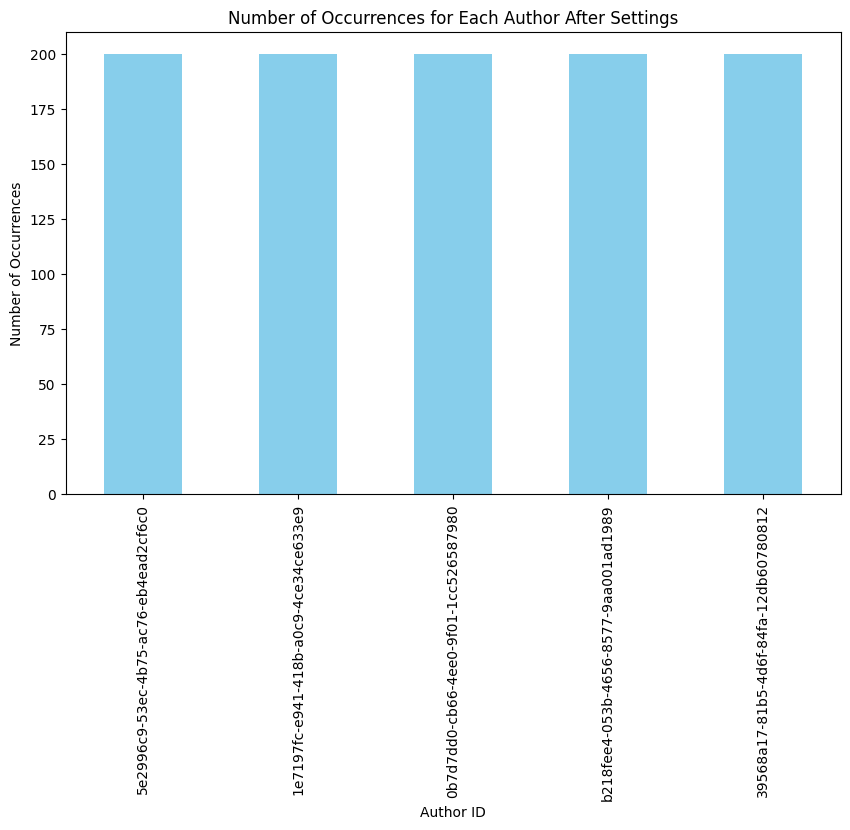

In [25]:
# Extract list of the useful id related to images
work_id_list = result_df['work_id'].to_list()
len(work_id_list)

# Count the occurrences of each author in result_df
author_counts = result_df['author_id'].value_counts()

# Plot the histogram
plt.figure(figsize=(10, 6))
author_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Occurrences for Each Author After Settings')
plt.xlabel('Author ID')
plt.ylabel('Number of Occurrences')
plt.show()

In [26]:
# Loop through the work_ids list and check if all file exists
for file_name in work_id_list:
    file_path = os.path.join(extraction_path, 'images', 'images', file_name)

    if not os.path.exists(file_path):
        print(f"File {file_name} does not exist in the directory.")

# If you prefer a boolean result indicating whether all files are present:
all_files_exist = all(os.path.exists(os.path.join(extraction_path, 'images', 'images', file_name)) for file_name in work_ids)
print(f"All files exist? {all_files_exist}")

All files exist? True


In [27]:
'''
# Loop through the files in the source path and remove non-selected art works
for file_name in os.listdir(os.path.join(extraction_path, 'images', 'images')):
    # Construct the full file path
    file_path = os.path.join(extraction_path, 'images', 'images', file_name)

    # Check if the file should be removed based on work_ids
    if file_name not in work_id_list:
        # Remove the file if it's not in the work_ids list
        os.remove(file_path)

print("Files removed successfully.")
'''

'\n# Loop through the files in the source path and remove non-selected art works\nfor file_name in os.listdir(os.path.join(extraction_path, \'images\', \'images\')):\n    # Construct the full file path\n    file_path = os.path.join(extraction_path, \'images\', \'images\', file_name)\n\n    # Check if the file should be removed based on work_ids\n    if file_name not in work_id_list:\n        # Remove the file if it\'s not in the work_ids list\n        os.remove(file_path)\n\nprint("Files removed successfully.")\n'

In [28]:
# Creating a dataframe with the data related to the work_id_list
result_df_final = result_df[result_df['work_id']==work_id_list]

# Add a column with the path to the images
result_df_final['image_path'] = result_df_final['work_id'].apply(lambda filename: os.path.join(extraction_path, 'images', 'images', filename))

# Merge df with the one containing just the ten authors
result_df_final = pd.merge(result_df_final, df_merged_final, on='author_id').drop('author_x', axis=1).rename(columns={'author_y': 'author'})

### Moving images

In [29]:
'''
shutil.rmtree('/content/prado_images')
'''

"\nshutil.rmtree('/content/prado_images')\n"

In [30]:
# Define the paths
source_folder = os.path.join(extraction_path, 'images', 'images')
output_folder = '/content/prado_images'

# Set a random seed for replicability
random_seed = 42

# Create train, test, and validation splits
sss_test = StratifiedShuffleSplit(n_splits=1, test_size=test_ratio + val_ratio, random_state=random_seed)
for train_index, test_validation_index in sss_test.split(result_df_final, result_df_final['author']):
    train_df = result_df_final.iloc[train_index]
    test_validation_df = result_df_final.iloc[test_validation_index]

sss_validation = StratifiedShuffleSplit(n_splits=1, test_size= val_ratio / (test_ratio + val_ratio), random_state=random_seed)
for test_index, validation_index in sss_validation.split(test_validation_df, test_validation_df['author']):
    test_df = test_validation_df.iloc[test_index]
    validation_df = test_validation_df.iloc[validation_index]

# Create train, test, and validation folders
for split in ['train', 'test', 'validation']:
    split_folder = os.path.join(output_folder, split)
    os.makedirs(split_folder, exist_ok=True)

    # Create subfolders for each author
    for author in result_df_final['author'].unique():
        author_folder = os.path.join(split_folder, str(author))
        os.makedirs(author_folder, exist_ok=True)

# Move images to their respective folders
for split, current_df in zip(['train', 'test', 'validation'], [train_df, test_df, validation_df]):
    for index, row in current_df.iterrows():
        source_path = os.path.join(source_folder, row['work_id'])
        destination_path = os.path.join(output_folder, split, str(row['author']), os.path.basename(row['image_path']))
        shutil.copy(source_path, destination_path)

In [31]:
# Count images in the "train" and "test" subfolders
print("---   TRAIN   ---")
count_images_in_subfolders(output_folder, "train")
print("---------------------")
print("---   VALIDATION   ---")
count_images_in_subfolders(output_folder, "validation")
print("---------------------")
print("---   TEST   ---")
count_images_in_subfolders(output_folder, "test")
print("---------------------")

---   TRAIN   ---
Subfolder 'Bayeu y Subías, Francisco' in 'train' contains 120 images.
Subfolder 'Goya y Lucientes, Francisco de' in 'train' contains 120 images.
Subfolder 'Haes, Carlos de' in 'train' contains 120 images.
Subfolder 'Ribera y Fieve, Carlos Luis de' in 'train' contains 120 images.
Subfolder 'Pizarro y Librado, Cecilio' in 'train' contains 120 images.
---------------------
---   VALIDATION   ---
Subfolder 'Bayeu y Subías, Francisco' in 'validation' contains 40 images.
Subfolder 'Goya y Lucientes, Francisco de' in 'validation' contains 40 images.
Subfolder 'Haes, Carlos de' in 'validation' contains 40 images.
Subfolder 'Ribera y Fieve, Carlos Luis de' in 'validation' contains 40 images.
Subfolder 'Pizarro y Librado, Cecilio' in 'validation' contains 40 images.
---------------------
---   TEST   ---
Subfolder 'Bayeu y Subías, Francisco' in 'test' contains 40 images.
Subfolder 'Goya y Lucientes, Francisco de' in 'test' contains 40 images.
Subfolder 'Haes, Carlos de' in 'tes

In [32]:
'''
# Remove temporary image folder
remove_non_empty_directory('/content/zip_file/images')
'''

"\n# Remove temporary image folder\nremove_non_empty_directory('/content/zip_file/images')\n"

### Plot images

In [33]:
train_path = '/content/prado_images/train'
validation_path = '/content/prado_images/validation'
test_path = '/content/prado_images/test'

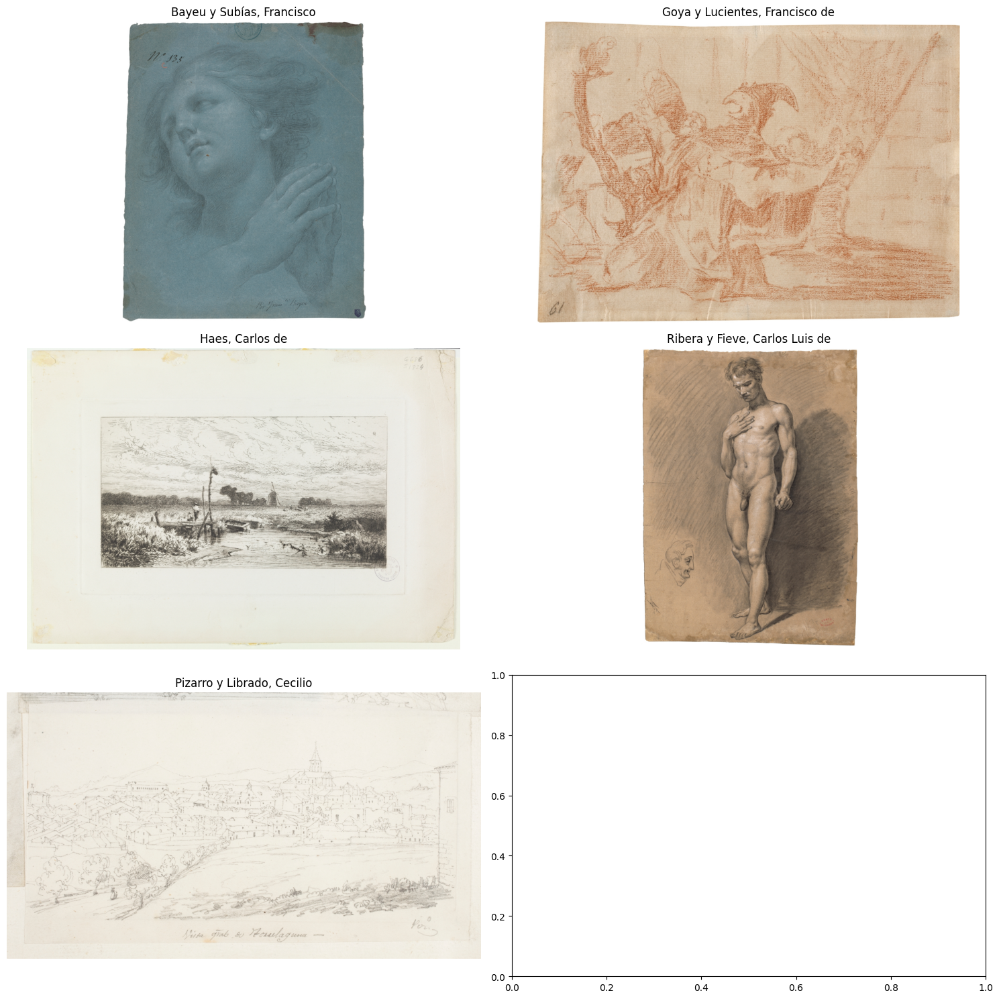

In [34]:
#Train
plot_images_from_folder(train_path)

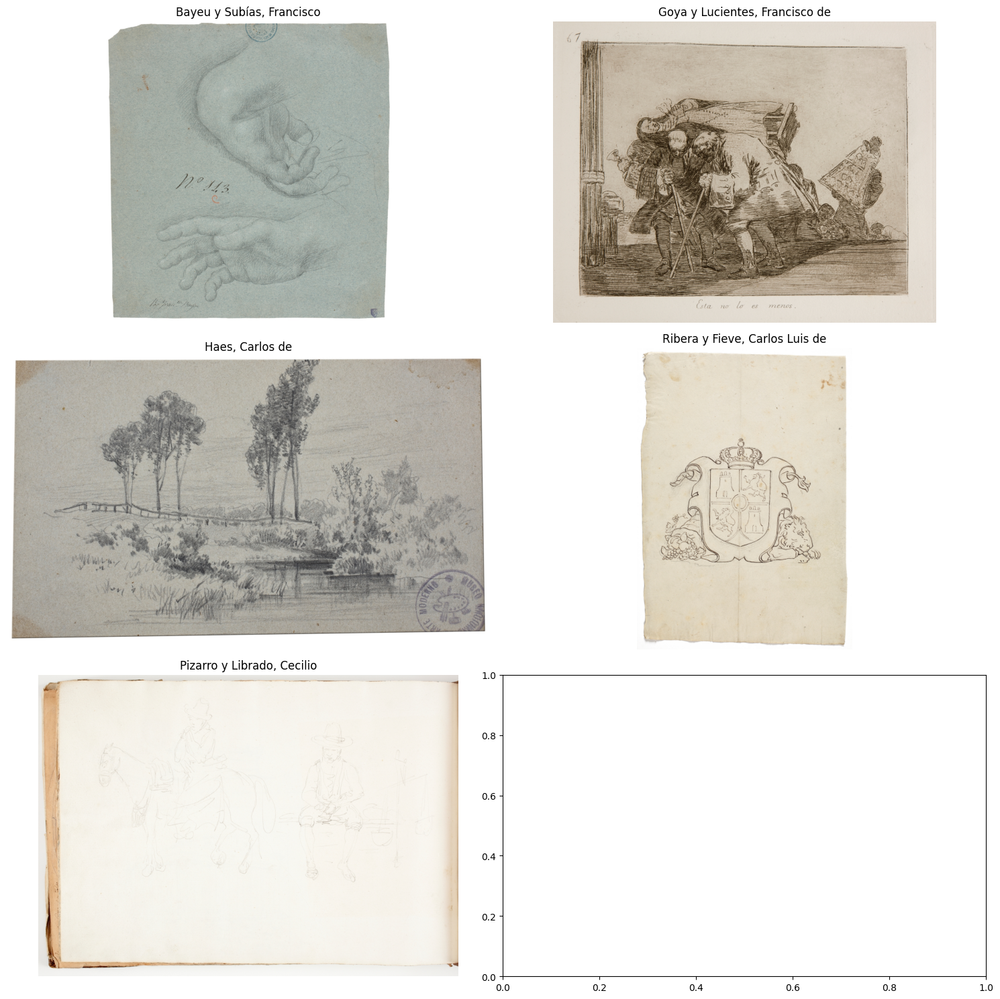

In [35]:
#Test
plot_images_from_folder(validation_path)

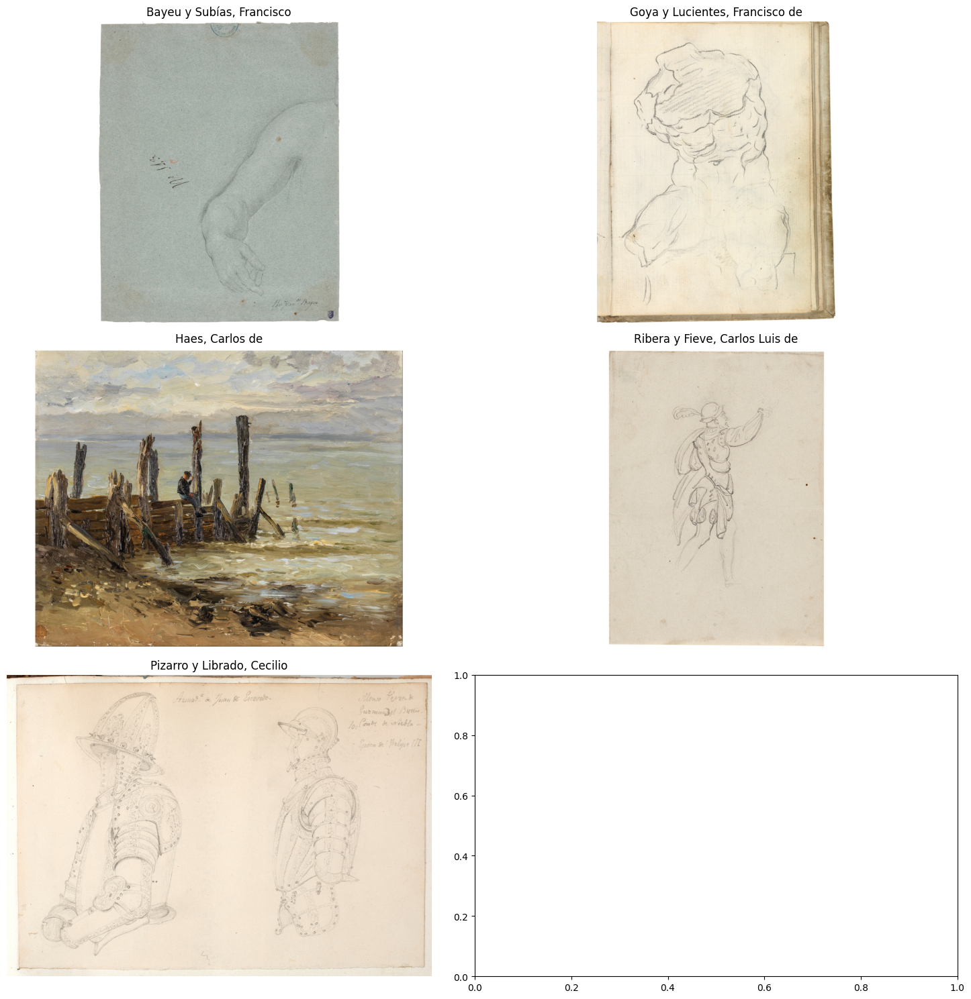

In [36]:
#Validation
plot_images_from_folder(test_path)

## Image processing

In [37]:
HEIGHT = 64
WIDTH = 64
BATCH = 20
EPOCHS = 20

In [38]:
train_data = tf.keras.utils.image_dataset_from_directory(
    train_path,
    image_size = (HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
    )

validation_data = tf.keras.utils.image_dataset_from_directory(
    validation_path,
    image_size = (HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
    )

test_data = tf.keras.utils.image_dataset_from_directory(
    test_path,
    image_size=(HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
)

Found 600 files belonging to 5 classes.
Found 200 files belonging to 5 classes.
Found 200 files belonging to 5 classes.


In [39]:
# Extraction of classes from tf.Dataset
classes = train_data.class_names
classes

['Bayeu y Subías, Francisco',
 'Goya y Lucientes, Francisco de',
 'Haes, Carlos de',
 'Pizarro y Librado, Cecilio',
 'Ribera y Fieve, Carlos Luis de']

In [40]:
# Compute class weights
weights_class = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(classes),
    y=classes)

weights_class_ = dict(zip(np.unique(classes), weights_class))
weights_class_dict = dict(enumerate(weights_class))
weights_class = {i: 1.0 for i in weights_class_dict.keys()}
weights_class_

{'Bayeu y Subías, Francisco': 1.0,
 'Goya y Lucientes, Francisco de': 1.0,
 'Haes, Carlos de': 1.0,
 'Pizarro y Librado, Cecilio': 1.0,
 'Ribera y Fieve, Carlos Luis de': 1.0}

In [41]:
# Processing image data from a training dataset and creating a DataFrame
data = []

for i, batch in enumerate(train_data):
  inputs, targets = batch
  for j in range(inputs.shape[0]):
    image = inputs[j].numpy()
    image = (image * 255).astype(np.uint8)
    filename = f"batch_{i}_image_{j}.jpg"
    with Image.fromarray(image) as img:
      width, height = img.size
      data.append ({'filename': filename, 'width': width, 'height': height})

train_df = pd.DataFrame(data)

train_df.nunique()

filename    600
width         1
height        1
dtype: int64

In [42]:
# Processing image data from a validation dataset and creating a DataFrame
data = []

for i, batch in enumerate(validation_data):
  inputs, targets = batch
  for j in range(inputs.shape[0]):
    image = inputs[j].numpy()
    image = (image * 255).astype(np.uint8)
    filename = f"batch_{i}_image_{j}.jpg"
    with Image.fromarray(image) as img:
      width, height = img.size
      data.append({'filename': filename, 'width': width, 'height': height})

validation_df = pd.DataFrame(data)
validation_df.nunique()

filename    200
width         1
height        1
dtype: int64

In [43]:
# Processing image data from a testing dataset and creating a DataFrame
data = []

for i, batch in enumerate(test_data):
  inputs, targets = batch
  for j in range(inputs.shape[0]):
    image = inputs[j].numpy()
    image = (image * 255).astype(np.uint8)
    filename = f"batch_{i}_image_{j}.jpg"
    with Image.fromarray(image) as img:
      width, height = img.size
      data.append({'filename': filename, 'width': width, 'height': height})

test_df = pd.DataFrame(data)
test_df.nunique()

filename    200
width         1
height        1
dtype: int64

## EDA

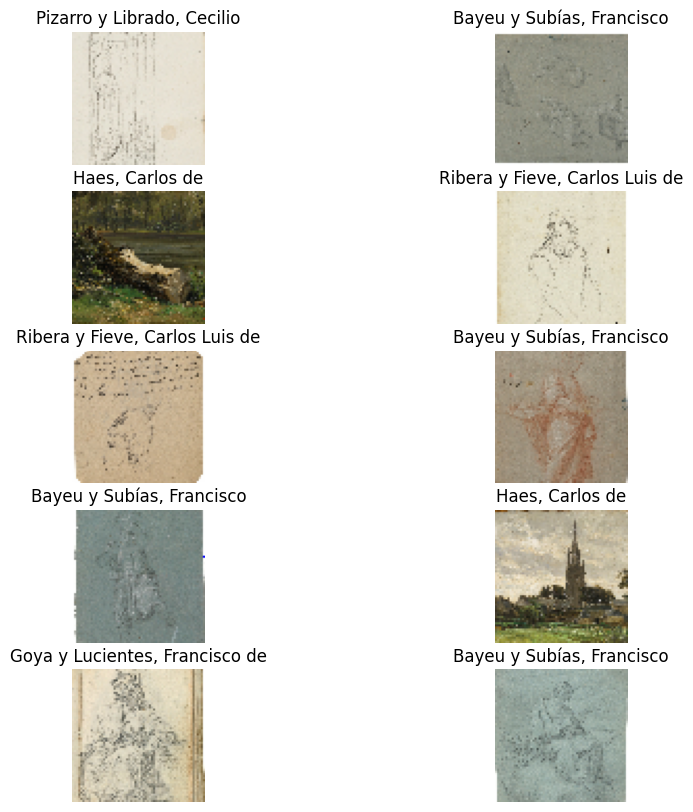

In [44]:
# Plotting images from train data
plt.figure(figsize=(10,10))

for images, labels in train_data.take(1):
  for i in range(10):
    ax = plt.subplot(5,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes[labels[i]])
    plt.axis('off')

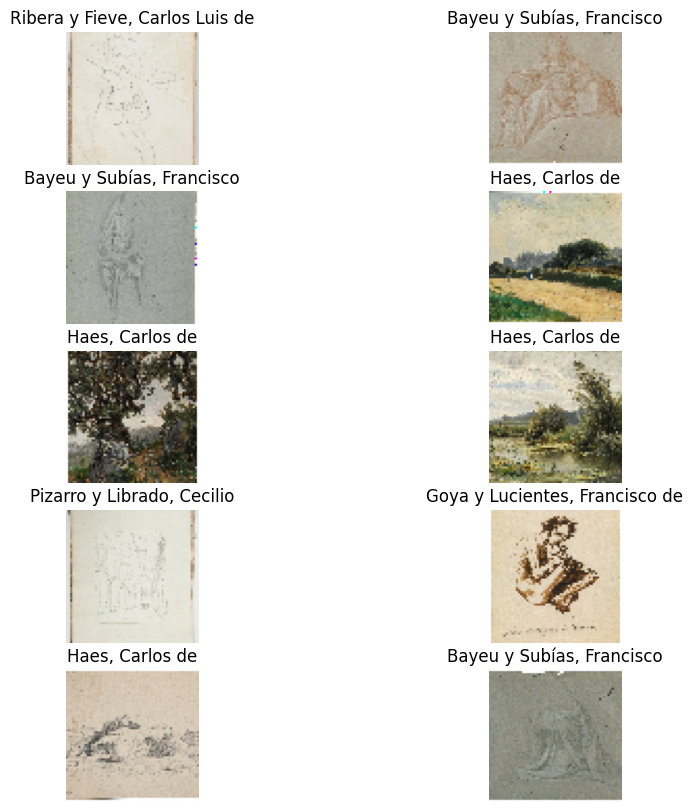

In [45]:
# Plotting images from validation data
plt.figure(figsize=(10,10))

for images, labels in validation_data.take(1):
  for i in range(10):
    ax = plt.subplot(5,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes[labels[i]])
    plt.axis('off')

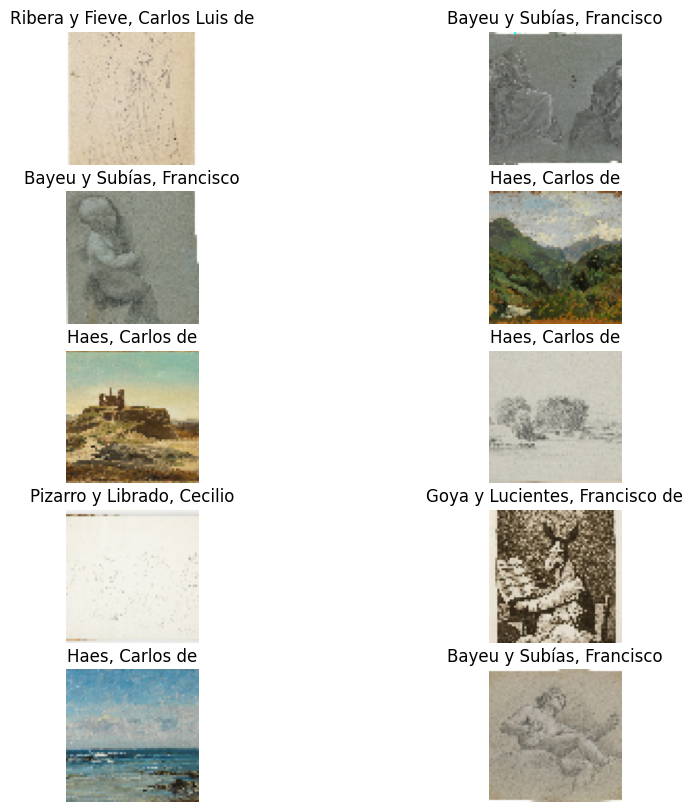

In [46]:
# Plotting images from test data
plt.figure(figsize=(10,10))

for images, labels in test_data.take(1):
  for i in range(10):
    ax = plt.subplot(5,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes[labels[i]])
    plt.axis('off')

In [47]:
# print the shape of the train batch of images and labels
for image_batch, labels_batch in train_data:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(20, 64, 64, 3)
(20,)


In [48]:
# print the shape of the validation batch of images and labels
for image_batch, labels_batch in validation_data:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(20, 64, 64, 3)
(20,)


In [49]:
# print the shape of the test batch of images and labels
for image_batch, labels_batch in test_data:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(20, 64, 64, 3)
(20,)


## Model preparation and deployment

In [50]:
# data augmentation pipeline
train_aug = Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical",input_shape = (HEIGHT, WIDTH, 3)), #random horizontal and vertical flips to the input images
    #layers.experimental.preprocessing.RandomZoom(height_factor=(-0.05, -0.15), width_factor=(-0.05, -0.15),fill_mode='nearest'), #layer introduces random zooming to the images and fills empty areas in zooms
    #layers.RandomBrightness(0.2), #adjusts the brightness of the images
    layers.RandomContrast(0.2), #adjusts the contrast of the images
    layers.RandomTranslation(0.05, 0.05), #random translations to the images in both the horizontal and vertical directions
    layers.RandomRotation(0.2) #random rotations to the images
])

In [51]:
# Dynamic tuning of performance-related parameters
AUTOTUNE = tf.data.AUTOTUNE

# Optimizing the data loading pipeline for training and validation by caching, shuffling, and prefetching the dataset elements
train_data = train_data.cache().shuffle(1000, seed=random_seed).prefetch(buffer_size=AUTOTUNE)
validation_data = validation_data.cache().prefetch(buffer_size=AUTOTUNE)

In [52]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

## Base model

In [53]:
# Model definition
def base_model():
  model = Sequential()
  #model.add(train_aug)
  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))

  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(32, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(64, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Flatten())
  model.add(layers.Dense(128, activation = 'relu'))
  model.add(layers.Dense(len(classes)))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])
  return model

In [54]:
b_model = base_model()
b_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 64)       

In [55]:
# Training
base_history = b_model.fit(train_data,
                           validation_data = validation_data,
                           epochs = EPOCHS,
                           class_weight = weights_class,
                           callbacks=[early_stopping])

Epoch 1/20
30/30 [==============================] - 32s 435ms/step - loss: 1.5743 - accuracy: 0.2850 - val_loss: 1.3373 - val_accuracy: 0.4350
Epoch 2/20
30/30 [==============================] - 3s 86ms/step - loss: 1.2944 - accuracy: 0.4867 - val_loss: 1.2121 - val_accuracy: 0.5600
Epoch 3/20
30/30 [==============================] - 3s 86ms/step - loss: 1.0764 - accuracy: 0.6017 - val_loss: 1.0508 - val_accuracy: 0.6050
Epoch 4/20
30/30 [==============================] - 2s 83ms/step - loss: 0.9246 - accuracy: 0.6400 - val_loss: 0.9184 - val_accuracy: 0.6650
Epoch 5/20
30/30 [==============================] - 3s 116ms/step - loss: 0.8100 - accuracy: 0.6733 - val_loss: 0.7729 - val_accuracy: 0.7150
Epoch 6/20
30/30 [==============================] - 3s 86ms/step - loss: 0.6735 - accuracy: 0.7500 - val_loss: 0.7573 - val_accuracy: 0.7350
Epoch 7/20
30/30 [==============================] - 3s 87ms/step - loss: 0.5947 - accuracy: 0.7700 - val_loss: 0.8366 - val_accuracy: 0.7450
Epoch 8/20

<Axes: >

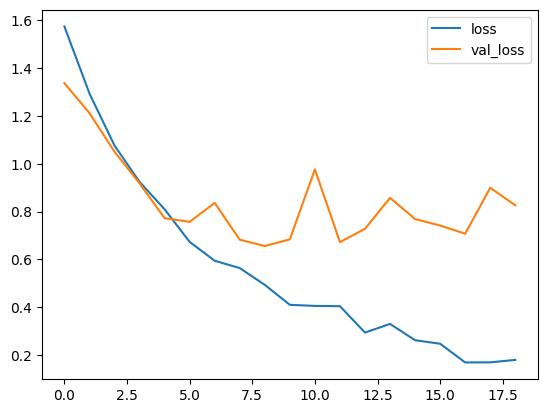

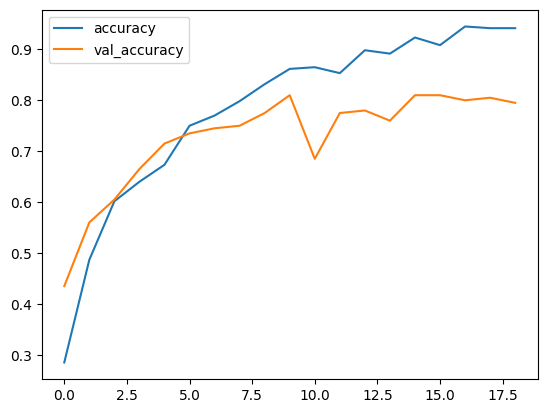

In [56]:
# Plotting performance model
history_df = pd.DataFrame(base_history.history)
history_df[['loss', 'val_loss']].plot()
history_df[['accuracy', 'val_accuracy']].plot()

In [57]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data):
  pred = b_model.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


In [58]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.867
Recall score: 0.9
Precision score: 0.9


In [59]:
# Model loss value & metrics values in test mode
b_model.evaluate(test_data)

10/10 [==============================] - 6s 82ms/step - loss: 0.7038 - accuracy: 0.7750


[0.7037999033927917, 0.7749999761581421]

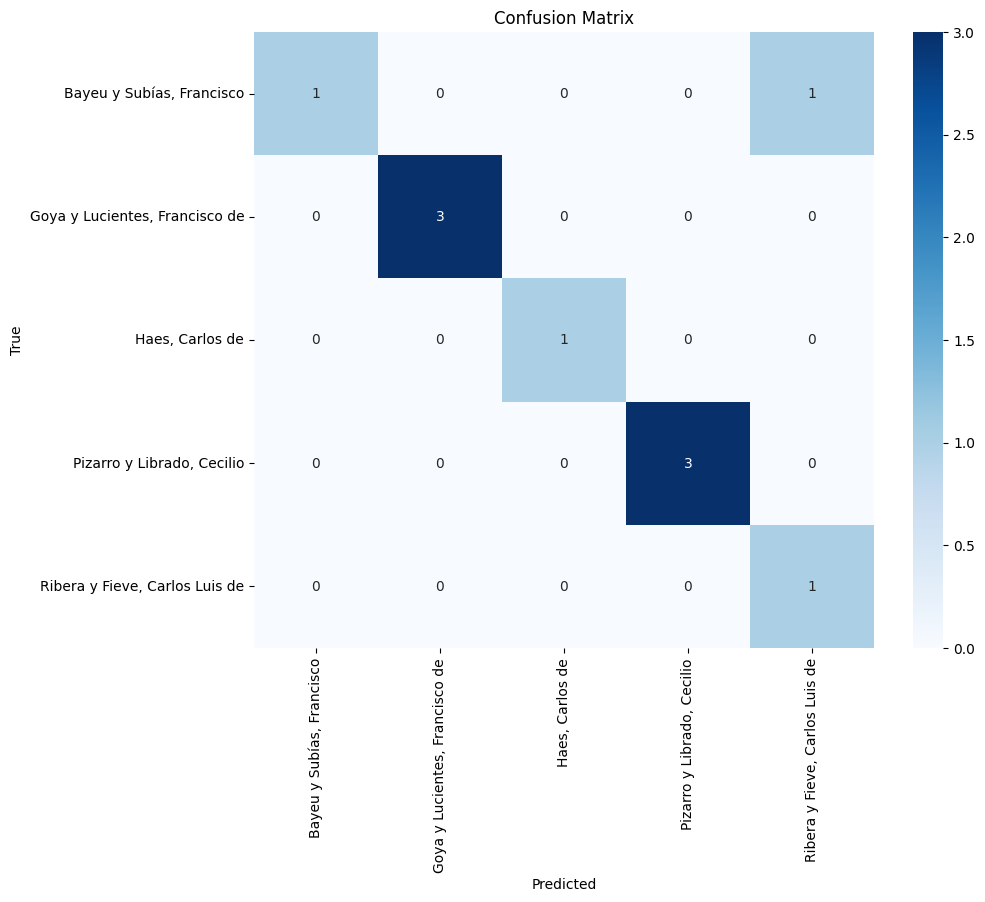

In [60]:
# Confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [61]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    0.5000    0.6667         2
           1     1.0000    1.0000    1.0000         3
           2     1.0000    1.0000    1.0000         1
           3     1.0000    1.0000    1.0000         3
           4     0.5000    1.0000    0.6667         1

    accuracy                         0.9000        10
   macro avg     0.9000    0.9000    0.8667        10
weighted avg     0.9500    0.9000    0.9000        10



In [62]:
tf.keras.backend.clear_session()

## Second model

In [63]:
# Model definition
def second_model():
  model = Sequential()
  #model.add(train_aug)
  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))
  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(32, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(64, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())

  model.add(layers.Dense(64, activation = 'relu'))
  model.add(layers.Flatten())
  model.add(layers.Dense(len(classes), 'softmax'))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])

  return model

In [64]:
second_model = second_model()
second_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 64, 64, 16)        64        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_1 (Bat  (None, 32, 32, 32)        1

In [65]:
# Training
second_history = second_model.fit(train_data,
                                  validation_data = validation_data,
                                  epochs = EPOCHS,
                                  class_weight = weights_class,
                                  callbacks=[early_stopping])

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


30/30 [==============================] - 6s 132ms/step - loss: 1.0803 - accuracy: 0.6083 - val_loss: 1.5986 - val_accuracy: 0.2000
Epoch 2/20
30/30 [==============================] - 4s 134ms/step - loss: 0.5896 - accuracy: 0.7917 - val_loss: 1.5285 - val_accuracy: 0.3500
Epoch 3/20
30/30 [==============================] - 3s 105ms/step - loss: 0.3151 - accuracy: 0.9017 - val_loss: 1.6593 - val_accuracy: 0.3550
Epoch 4/20
30/30 [==============================] - 4s 136ms/step - loss: 0.1922 - accuracy: 0.9500 - val_loss: 1.8962 - val_accuracy: 0.2800
Epoch 5/20
30/30 [==============================] - 3s 106ms/step - loss: 0.1173 - accuracy: 0.9633 - val_loss: 1.8897 - val_accuracy: 0.3800
Epoch 6/20
30/30 [==============================] - 3s 105ms/step - loss: 0.0808 - accuracy: 0.9817 - val_loss: 1.9586 - val_accuracy: 0.3850
Epoch 7/20
30/30 [==============================] - 4s 148ms/step - loss: 0.0377 - accuracy: 0.9983 - val_loss: 2.1473 - val_accuracy: 0.3800
Epoch 8/20
30/30 

<Axes: >

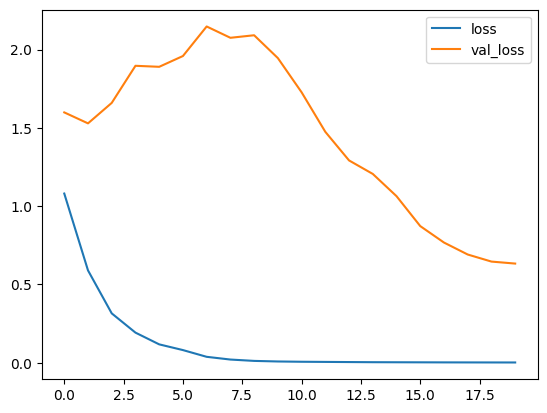

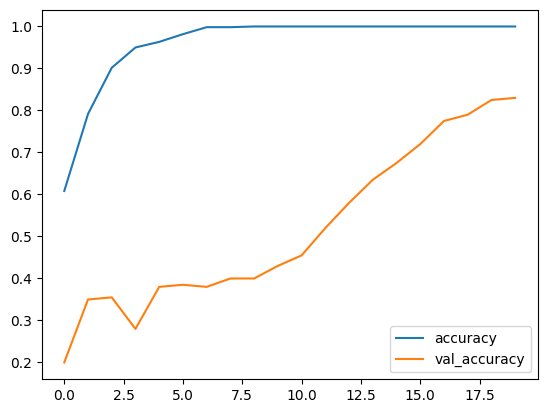

In [66]:
# Plotting performance results
history_df = pd.DataFrame(second_history.history)
history_df[['loss', 'val_loss']].plot()
history_df[['accuracy', 'val_accuracy']].plot()

In [67]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data):
  pred = second_model.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

100%|██████████| 10/10 [00:06<00:00,  1.63it/s]


In [68]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.76
Recall score: 0.8
Precision score: 0.733


In [69]:
# Model loss value & metrics values in test mode
second_model.evaluate(test_data)

10/10 [==============================] - 7s 83ms/step - loss: 0.7784 - accuracy: 0.7900


[0.7784377932548523, 0.7900000214576721]

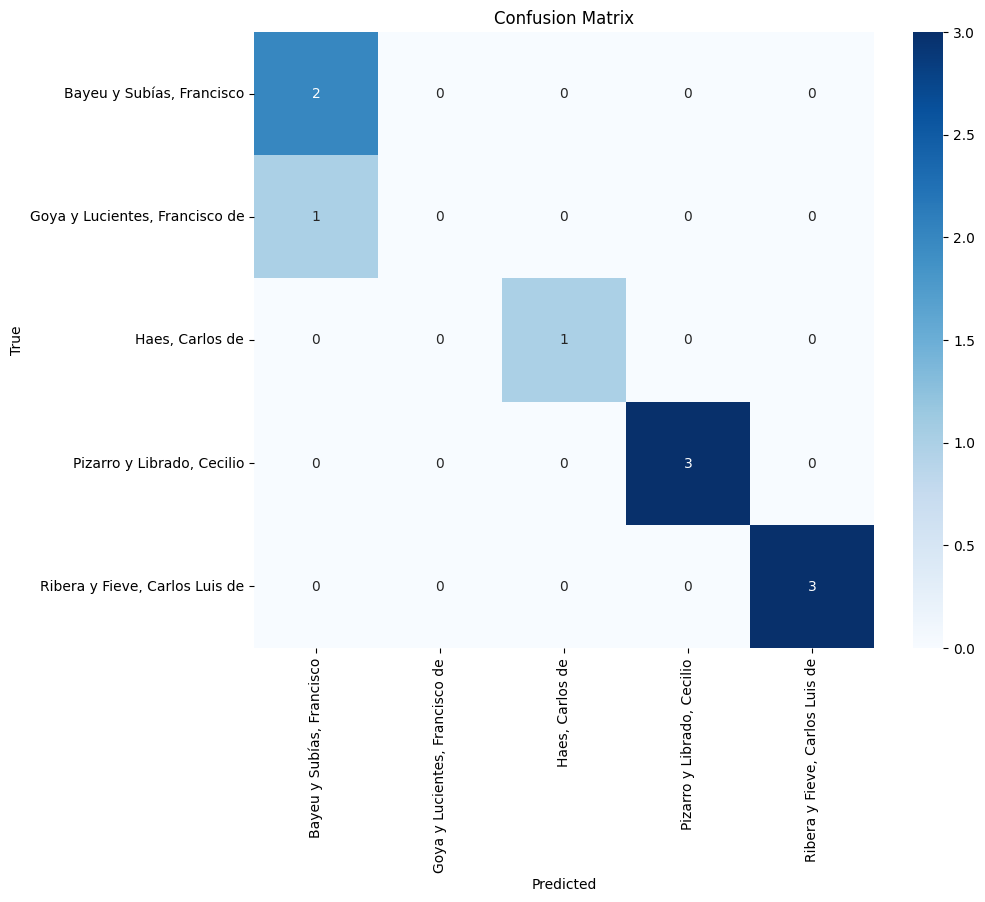

In [70]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [71]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     0.6667    1.0000    0.8000         2
           1     0.0000    0.0000    0.0000         1
           2     1.0000    1.0000    1.0000         1
           3     1.0000    1.0000    1.0000         3
           4     1.0000    1.0000    1.0000         3

    accuracy                         0.9000        10
   macro avg     0.7333    0.8000    0.7600        10
weighted avg     0.8333    0.9000    0.8600        10



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [72]:
tf.keras.backend.clear_session()

## Third Model

In [73]:
# Model definition
def third_model():
  model = Sequential()
  model.add(train_aug)
  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))

  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())

  model.add(layers.Flatten())
  model.add(layers.Dense(len(classes)))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])

  return model

In [74]:
third_model = third_model()
third_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 64, 64, 3)         0         
                                                                 
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 64, 64, 16)        64        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 16384)             0

In [75]:
# Training
third_history = third_model.fit(train_data,
                                validation_data = validation_data,
                                epochs = EPOCHS,
                                class_weight = weights_class,
                                callbacks=[early_stopping])

Epoch 1/20
30/30 [==============================] - 4s 75ms/step - loss: 1.8369 - accuracy: 0.4117 - val_loss: 3.4919 - val_accuracy: 0.2000
Epoch 2/20
30/30 [==============================] - 3s 116ms/step - loss: 1.3018 - accuracy: 0.5550 - val_loss: 2.0227 - val_accuracy: 0.2200
Epoch 3/20
30/30 [==============================] - 2s 69ms/step - loss: 1.2469 - accuracy: 0.5483 - val_loss: 1.6418 - val_accuracy: 0.2400
Epoch 4/20
30/30 [==============================] - 2s 69ms/step - loss: 1.1841 - accuracy: 0.5800 - val_loss: 1.2844 - val_accuracy: 0.4100
Epoch 5/20
30/30 [==============================] - 2s 74ms/step - loss: 1.0661 - accuracy: 0.6050 - val_loss: 1.2131 - val_accuracy: 0.5600
Epoch 6/20
30/30 [==============================] - 3s 89ms/step - loss: 0.9972 - accuracy: 0.6450 - val_loss: 1.1694 - val_accuracy: 0.5850
Epoch 7/20
30/30 [==============================] - 3s 102ms/step - loss: 0.9577 - accuracy: 0.6517 - val_loss: 1.1088 - val_accuracy: 0.5800
Epoch 8/20


<Axes: >

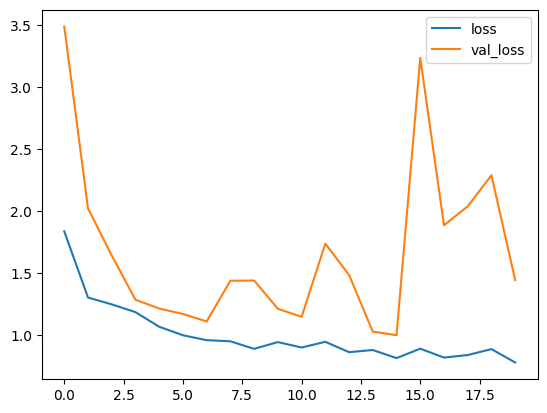

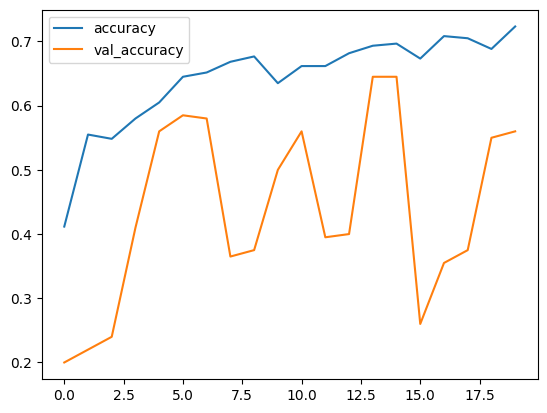

In [76]:
# Plotting results
history_df = pd.DataFrame(third_history.history)
history_df[['loss', 'val_loss']].plot()
history_df[['accuracy', 'val_accuracy']].plot()

In [77]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data):
  pred = third_model.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

assert len(trues) == len(preds)

100%|██████████| 10/10 [00:10<00:00,  1.02s/it]


In [78]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.348
Recall score: 0.433
Precision score: 0.367


In [79]:
# Model loss value & metrics values in test mode
third_model.evaluate(test_data)

10/10 [==============================] - 7s 96ms/step - loss: 1.7310 - accuracy: 0.5500


[1.731011986732483, 0.550000011920929]

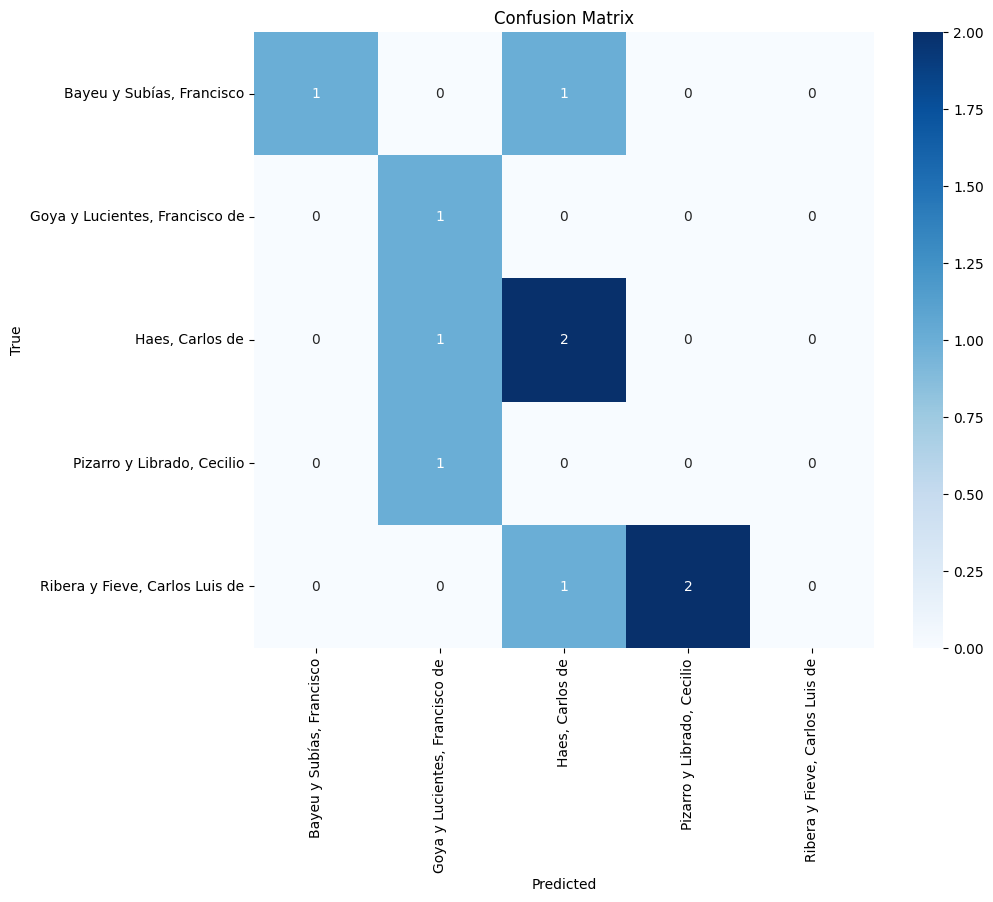

In [80]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [81]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    0.5000    0.6667         2
           1     0.3333    1.0000    0.5000         1
           2     0.5000    0.6667    0.5714         3
           3     0.0000    0.0000    0.0000         1
           4     0.0000    0.0000    0.0000         3

    accuracy                         0.4000        10
   macro avg     0.3667    0.4333    0.3476        10
weighted avg     0.3833    0.4000    0.3548        10



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [82]:
tf.keras.backend.clear_session()

## Hyper Parameter Model

In [83]:
# Model definition
def build_model(hp):
    # create model object
      model = Sequential()
      model.add(train_aug)
      model.add(layers.Rescaling(1./255))

    #adding first convolutional layer
      model.add(layers.Conv2D(filters=hp.Int('conv_1_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_1_kernel', values = [3,5]),
                              activation='relu',
                              input_shape=(HEIGHT, WIDTH, 3)))
      model.add(layers.MaxPooling2D())

    # adding second convolutional layer
      model.add(layers.Conv2D(filters=hp.Int('conv_2_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
                              activation='relu'))
      model.add(layers.MaxPooling2D())

    # adding third convolutional layer
      model.add(layers.Conv2D(filters=hp.Int('conv_3_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_3_kernel', values = [3,5]),
                              activation='relu'))
      model.add(layers.MaxPooling2D())
      model.add(layers.Flatten())

    # adding dense layer
      model.add(layers.Dense(units=hp.Int('dense_1_units', min_value=16, max_value=128, step=16, sampling='linear'),
                             activation='relu'))
      model.add(layers.Dense(units=hp.Int('dense_2_units', min_value=16, max_value=128, step=16, sampling='linear'),
                             activation='relu'))

    # output layer
      model.add(layers.Dense(len(classes), activation='softmax'))

    #compilation of model
      model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-3, 1e-4])),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
      return model

tuner_ = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='keras_tuner_dir',
    project_name='keras_tuner_demo2'
)

tuner_.search(train_data,
              epochs=5,
              validation_data=(validation_data),
              callbacks=[keras.callbacks.TensorBoard("/keras_tuner_dir/tb_logs")])

#%tensorboard --logdir /keras_tuner_dir/tb_logs

Trial 30 Complete [00h 02m 50s]
val_accuracy: 0.5249999761581421

Best val_accuracy So Far: 0.574999988079071
Total elapsed time: 00h 36m 05s


In [84]:
# Code for showing tensorboard
# https://keras.io/guides/keras_tuner/visualize_tuning/
#%load_ext tensorboard
#%tensorboard --logdir /keras_tuner_dir/tb_logs

In [85]:
# Selecting best performing model
model = tuner_.get_best_models(num_models=1)[0]

# Summary of best model
#model.summary()

In [86]:
# Training
hyper_history = model.fit(train_data,
                          epochs=EPOCHS,
                          validation_data=(validation_data))

Epoch 1/20
30/30 [==============================] - 28s 859ms/step - loss: 1.1656 - accuracy: 0.5233 - val_loss: 1.2240 - val_accuracy: 0.3950
Epoch 2/20
30/30 [==============================] - 25s 832ms/step - loss: 1.1140 - accuracy: 0.4983 - val_loss: 1.0133 - val_accuracy: 0.6000
Epoch 3/20
30/30 [==============================] - 26s 853ms/step - loss: 1.1702 - accuracy: 0.5167 - val_loss: 1.2244 - val_accuracy: 0.4850
Epoch 4/20
30/30 [==============================] - 25s 830ms/step - loss: 1.1908 - accuracy: 0.4950 - val_loss: 1.0782 - val_accuracy: 0.6050
Epoch 5/20
30/30 [==============================] - 25s 829ms/step - loss: 1.1213 - accuracy: 0.5333 - val_loss: 1.0139 - val_accuracy: 0.5900
Epoch 6/20
30/30 [==============================] - 25s 831ms/step - loss: 1.0788 - accuracy: 0.5600 - val_loss: 1.0964 - val_accuracy: 0.5350
Epoch 7/20
30/30 [==============================] - 26s 859ms/step - loss: 1.0325 - accuracy: 0.5617 - val_loss: 0.9302 - val_accuracy: 0.5800

<Axes: >

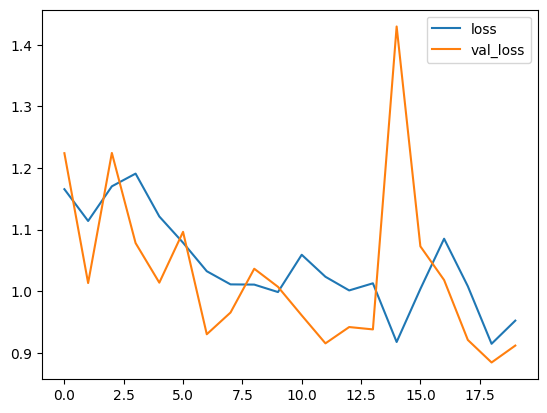

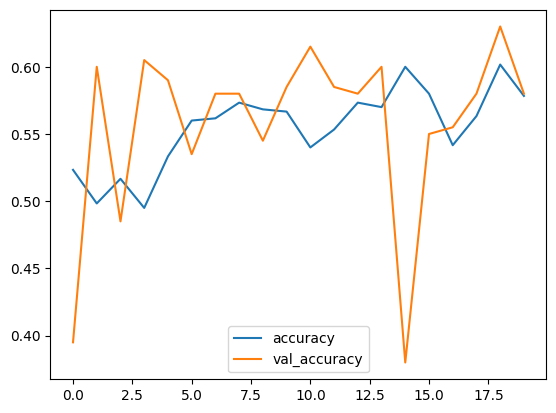

In [87]:
# Plotting results
history_df = pd.DataFrame(hyper_history.history)
history_df[['loss', 'val_loss']].plot()
history_df[['accuracy', 'val_accuracy']].plot()

In [88]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data):
  pred = third_model.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

assert len(trues) == len(preds)

100%|██████████| 10/10 [00:10<00:00,  1.02s/it]


In [89]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.679
Recall score: 0.667
Precision score: 0.775


In [90]:
# Model loss value & metrics values in test mode
model.evaluate(test_data)

10/10 [==============================] - 8s 231ms/step - loss: 0.9994 - accuracy: 0.5850


[0.999428391456604, 0.5849999785423279]

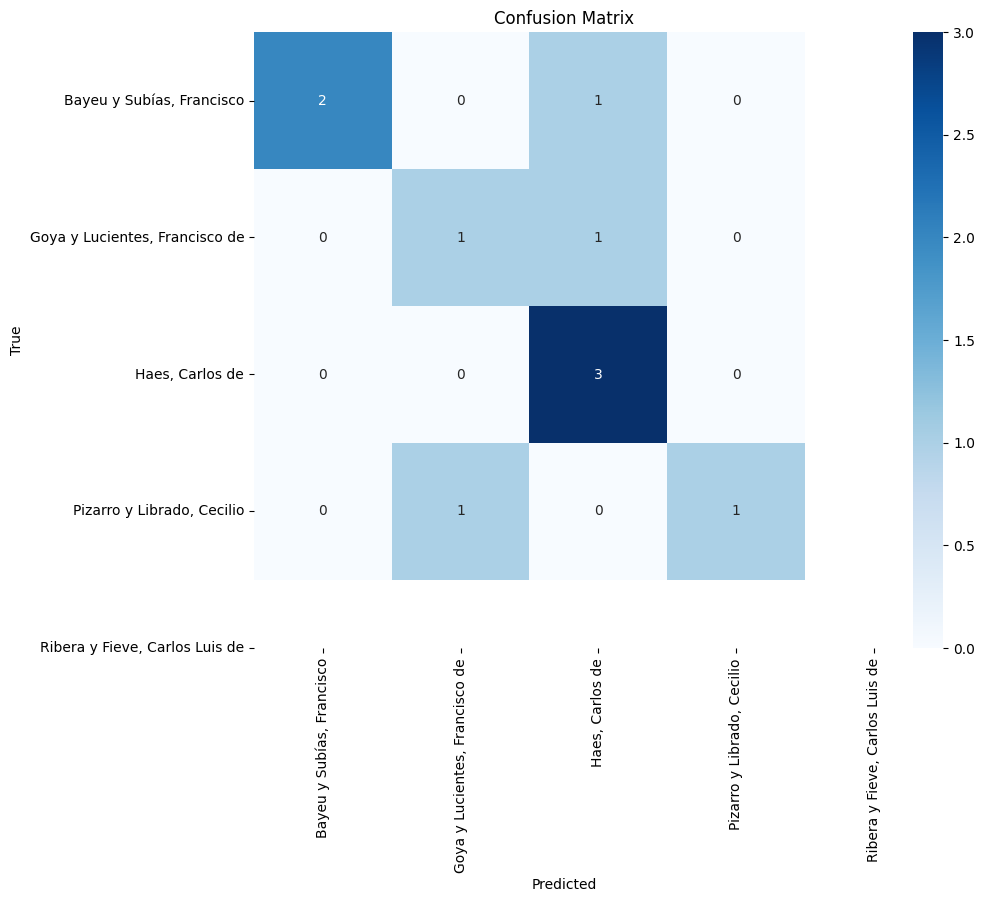

In [91]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [92]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    0.6667    0.8000         3
           1     0.5000    0.5000    0.5000         2
           2     0.6000    1.0000    0.7500         3
           3     1.0000    0.5000    0.6667         2

    accuracy                         0.7000        10
   macro avg     0.7750    0.6667    0.6792        10
weighted avg     0.7800    0.7000    0.6983        10



In [93]:
tf.keras.backend.clear_session()

# Time

In [94]:
end_time = time.time()
execution_time = round((end_time - start_time)/60)

print(f"Execution time: {execution_time} minutes")

Execution time: 63 minutes
